# Section2 Project



In [ ]:
#!pip install pandas-profiling --upgrade
!pip install category_encoders
!pip install scikit-learn --upgrade
!pip install eli5
!pip install shap

### Import Libraries 


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, cross_val_score
from pandas_profiling import ProfileReport
from sklearn.utils.class_weight import compute_class_weight

from category_encoders import OneHotEncoder, OrdinalEncoder, TargetEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline

from sklearn.metrics import f1_score, confusion_matrix, plot_confusion_matrix, roc_auc_score, classification_report, PrecisionRecallDisplay, ConfusionMatrixDisplay

from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression


/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Pre-proccessing Data

In [2]:
df = pd.read_csv('/content/bank-direct-marketing-campaigns.csv')
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [ ]:
# df.dtypes, df.isna().sum()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  campaign        41188 non-null  int64  
 11  pdays           41188 non-null  int64  
 12  previous        41188 non-null  int64  
 13  poutcome        41188 non-null  object 
 14  emp.var.rate    41188 non-null  float64
 15  cons.price.idx  41188 non-null  float64
 16  cons.conf.idx   41188 non-null  float64
 17  euribor3m       41188 non-null 

In [ ]:
df.nunique()

age                78
job                12
marital             4
education           8
default             3
housing             3
loan                3
contact             2
month              10
day_of_week         5
campaign           42
pdays              27
previous            8
poutcome            3
emp.var.rate       10
cons.price.idx     26
cons.conf.idx      26
euribor3m         316
nr.employed        11
y                   2
dtype: int64

In [ ]:
print(df.shape)
print(df.duplicated().sum())

(41188, 20)
1784


In [3]:
# remove duplicates
df = df.drop_duplicates()
print(df.shape)
print(df.duplicated().sum())

(39404, 20)
0


In [4]:
# change target col from 'yes/no' to '1/0'
df['y']=df['y'].apply(lambda x: 1 if x == 'yes' else 0)

## Baseline & Train / Test Set

In [5]:
train, test = train_test_split(df, test_size=0.2, train_size=0.8)

print(train.shape, test.shape)

X_train = train.drop(columns='y')
X_test = test.drop(columns='y')

y_train = train['y']
y_test = test['y']

print(X_train.shape, X_test.shape)
print(y_train.shape, y_test.shape)

df['y'].value_counts(normalize=True)

(31523, 20) (7881, 20)
(31523, 19) (7881, 19)
(31523,) (7881,)


0    0.883311
1    0.116689
Name: y, dtype: float64

In [7]:
target_values = df['y'].value_counts()
target_values

0    34806
1     4598
Name: y, dtype: int64

In [ ]:
df.count()

age               41188
job               41188
marital           41188
education         41188
default           41188
housing           41188
loan              41188
contact           41188
month             41188
day_of_week       41188
campaign          41188
pdays             41188
previous          41188
poutcome          41188
emp.var.rate      41188
cons.price.idx    41188
cons.conf.idx     41188
euribor3m         41188
nr.employed       41188
y                 41188
dtype: int64

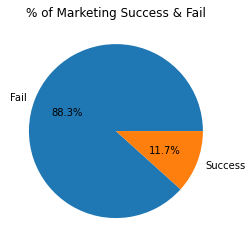

In [8]:
#ax2.pie(genre_group_count_df['Total_Sales'],labels=genre_group_count_df['Genre'],autopct='%1.1f%%')

plt.title('% of Marketing Success & Fail')
plt.pie(target_values, labels=['Fail','Success'], autopct='%1.1f%%')
plt.show()

              precision    recall  f1-score   support

           0       0.00      0.00      0.00     27815
           1       0.12      1.00      0.21      3708

    accuracy                           0.12     31523
   macro avg       0.06      0.50      0.11     31523
weighted avg       0.01      0.12      0.02     31523



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


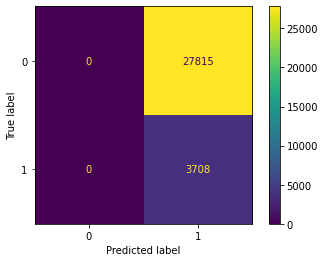

In [9]:
baseline_pred = [1] * len(X_train)
f1_score(y_train, baseline_pred)

print(classification_report(y_train, baseline_pred))
cm = confusion_matrix(y_train, baseline_pred)
ConfusionMatrixDisplay(cm).plot()
# Accuracy = 88 
# f1-score

## EDA

In [ ]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
print(df.columns)
num_cols = ['age','campaign','pdays','previous','emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
       'euribor3m', 'nr.employed']
cat_cols = ['job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week','poutcome']

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'campaign', 'pdays', 'previous',
       'poutcome', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
       'euribor3m', 'nr.employed', 'y'],
      dtype='object')


### Age & Target

Text(0.05, -0.05, '\nObservation:\n \nCampaign seem to be most successful among younger (< 20 years old) and older clients {>60 years old}\n')

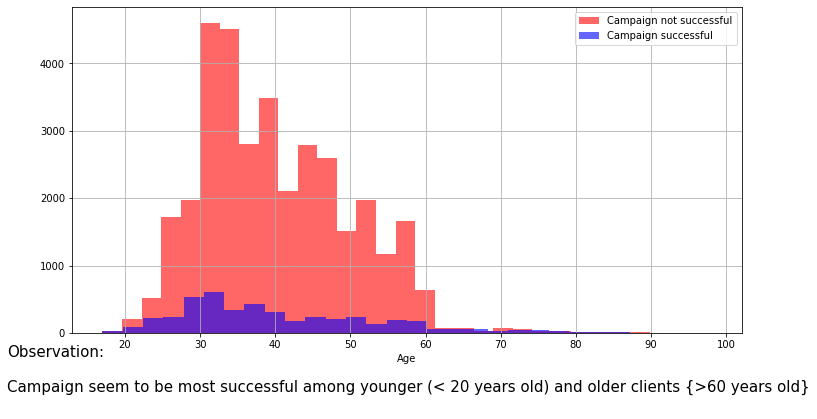

In [ ]:
plt.figure(figsize=(12,6))
df[df['y']=='no']['age'].hist(alpha=0.6,color='red', bins=30,label='Campaign not successful')
df[df['y']=='yes']['age'].hist(alpha=0.6,color='blue',bins=30,label='Campaign successful')
plt.legend()
plt.xlabel('Age')

plt.figtext(0.05,-0.05,'''
Observation:\n 
Campaign seem to be most successful among younger (< 20 years old) and older clients {>60 years old}
''', family='San', size=15, ha='left')

### Categorical Data & Martekting Success(Target)


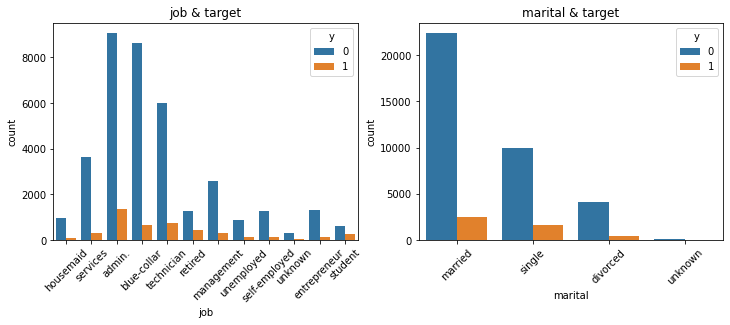

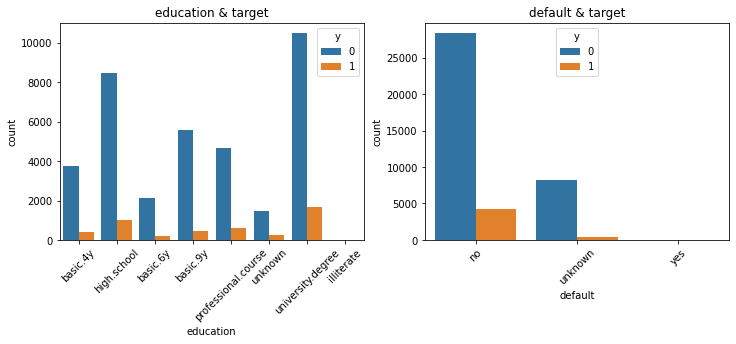

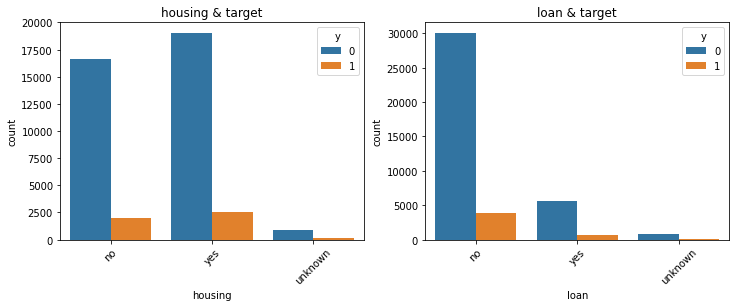

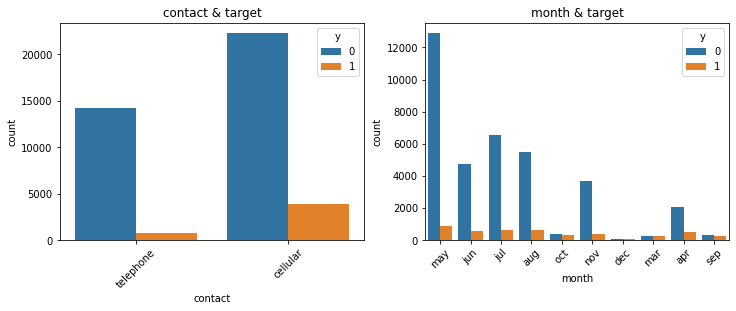

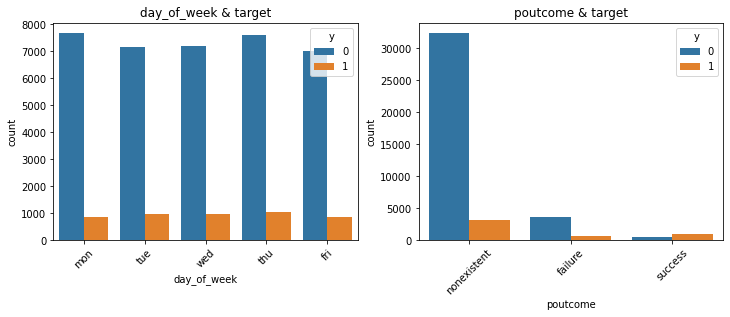

In [ ]:
def drawCountPlot(x, df):
  fig, (ax1,ax2) = plt.subplots(1,2,figsize=(12, 4)) 

  s1 = sns.countplot(x=x[0], hue="y", data=df, ax=ax1)
  s1.tick_params(axis='x', rotation=45)
  s1.set_title(x[0]+' & target')

  s2 = sns.countplot(x=x[1], hue="y", data=df, ax=ax2)
  s2.tick_params(axis='x', rotation=45)
  s2.set_title(x[1]+' & target')


i = 0
while i < len(cat_cols):
  temp = []
  temp.append(cat_cols[i])
  temp.append(cat_cols[i + 1])
  drawCountPlot(temp, df)
  i = i + 2

### Marketing Success (Target) in % for each Cat.

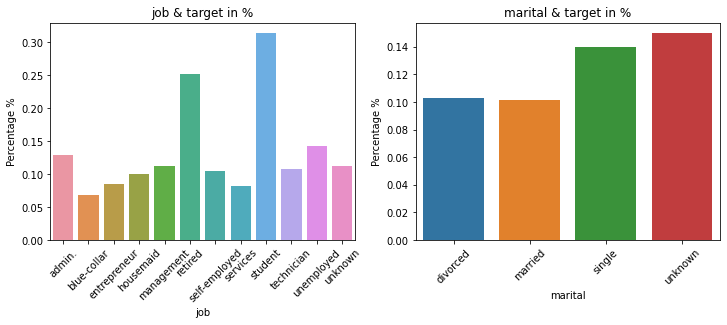

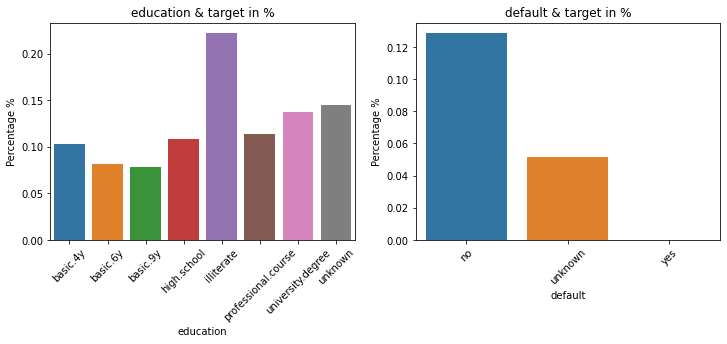

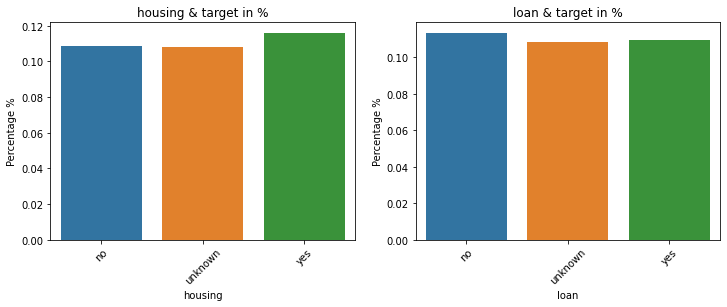

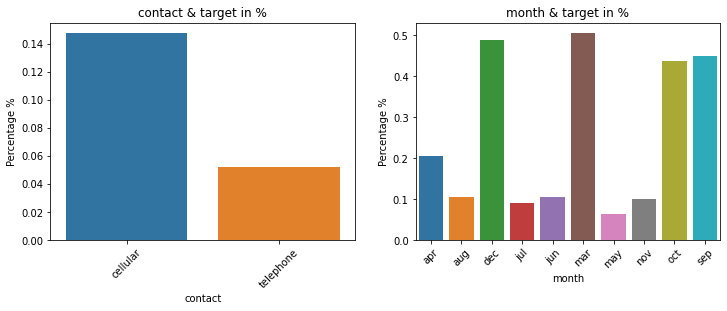

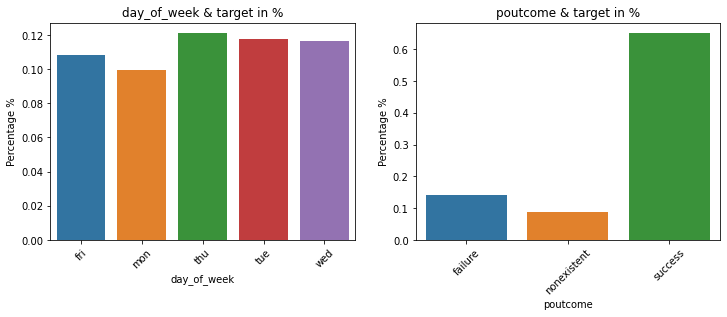

In [ ]:
def drawCountPlot(x, df):
  fig, (ax1,ax2) = plt.subplots(1,2,figsize=(12, 4)) 

  df_total = df.groupby([x[0]])['y'].count().reset_index()
  df_yes = df.groupby([x[0]])['y'].sum().reset_index()
  df_total['y_per'] = df_yes['y'] / df_total['y']

  s1 = sns.barplot(x = x[0], y = 'y_per', data = df_total, ax=ax1)
  s1.tick_params(axis='x', rotation=45)
  s1.set_title(x[0]+' & target in %')
  s1.set(ylabel='Percentage %')

  df_total = df.groupby([x[1]])['y'].count().reset_index()
  df_yes = df.groupby([x[1]])['y'].sum().reset_index()
  df_total['y_per'] = df_yes['y'] / df_total['y']

  s2 = sns.barplot(x = x[1], y = 'y_per', data = df_total, ax=ax2)
  s2.tick_params(axis='x', rotation=45)
  s2.set_title(x[1]+' & target in %')
  s2.set(ylabel='Percentage %')

i = 0
while i < len(cat_cols):
  temp = []
  temp.append(cat_cols[i])
  temp.append(cat_cols[i + 1])
  drawCountPlot(temp, df)
  i = i + 2

### Correlation Heatmap for Numeric Features

In [ ]:
num_col_df = df[num_cols]
num_col_df['y'] = df['y']


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


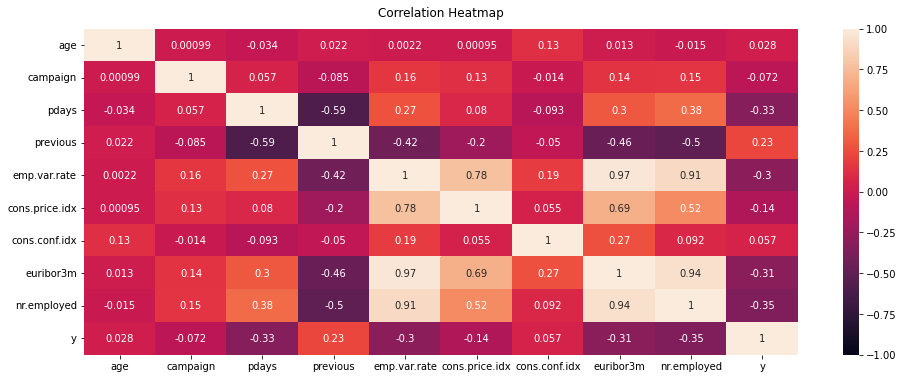

In [ ]:
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(num_col_df.corr(), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

## Feature Engineering

### Change Data Types

In [10]:
def engineer(df):

  # Change Datatypes
  bool_features = ['default','housing','loan']

  for feature in bool_features:
    df[feature] = df[feature].apply(lambda x: 1 if x == 'yes' else ( 0 if x == 'no' else -1))
  # Change Str to 1/0/-1
  df['poutcome'] = df['poutcome'].apply(lambda x: 1 if x == 'success' else (0 if x =='failure' else -1))
  # change to binaray
  df['contact'] = df['contact'].apply(lambda x: 1 if x == 'cellular' else 0)

  # create new feature
  df['contact_before'] = df['pdays'].apply(lambda x: 1 if x != 999 else 0)

  # 999 to -1 to reduce the distribution
  df['pdays'] = df['pdays'].apply(lambda x: -1 if x == 999 else x)

  # str to numbers
  df['month'] = pd.to_datetime(df['month'],format='%b').dt.month
  df['day_of_week'] = df['day_of_week'].map({'mon': 0, 'tue': 1, 'wed':2, 'thu':3,'fri':4})

  # change to appro. name
  df.rename(columns={'contact': 'contact_by_cell'})

  return df

# apply engineering on datasets
X_train = engineer(X_train)
X_test = engineer(X_test)

In [ ]:
print(X_train.shape)
print(X_train.info())

(31523, 20)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 31523 entries, 30426 to 26083
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             31523 non-null  int64  
 1   job             31523 non-null  object 
 2   marital         31523 non-null  object 
 3   education       31523 non-null  object 
 4   default         31523 non-null  int64  
 5   housing         31523 non-null  int64  
 6   loan            31523 non-null  int64  
 7   contact         31523 non-null  int64  
 8   month           31523 non-null  int64  
 9   day_of_week     31523 non-null  int64  
 10  campaign        31523 non-null  int64  
 11  pdays           31523 non-null  int64  
 12  previous        31523 non-null  int64  
 13  poutcome        31523 non-null  int64  
 14  emp.var.rate    31523 non-null  float64
 15  cons.price.idx  31523 non-null  float64
 16  cons.conf.idx   31523 non-null  float64
 17  euribor3m      

In [ ]:
X_train.isna().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
age_group         0
contact_before    0
dtype: int64

## Train & Compare Models


### Create under/over sampled datasets

In [11]:
num_0 = len(train[train['y']==0])
num_1 = len(train[train['y']==1])
print(num_0,num_1)

# random undersample
X_undersample = pd.concat([ train[train['y']==0].sample(num_1) , train[train['y']==1] ])
print(len(X_undersample))

# random oversample
X_oversample = pd.concat([ train[train['y']==0] , train[train['y']==1].sample(num_0, replace=True) ])
print(len(X_oversample))

print(X_undersample['y'].value_counts())
print(X_oversample['y'].value_counts())

y_undersample = X_undersample['y']
y_oversample = X_oversample['y']

X_undersample.drop(columns='y', inplace=True)
X_oversample.drop(columns='y', inplace=True)

X_undersample = engineer(X_undersample)
X_oversample = engineer(X_oversample)

27815 3708
7416
55630
1    3708
0    3708
Name: y, dtype: int64
1    27815
0    27815
Name: y, dtype: int64


In [ ]:
print('Normal Train Dataset')
print(y_train.value_counts())
print()
print('Undersampled Train Dataset')
print(y_undersample.value_counts())
print()
print('Oversampled Train Dataset')
print(y_oversample.value_counts())

Normal Train Dataset
0    27878
1     3645
Name: y, dtype: int64

Undersampled Train Dataset
1    3645
0    3645
Name: y, dtype: int64

Oversampled Train Dataset
1    27878
0    27878
Name: y, dtype: int64


### Logistic Regression

              precision    recall  f1-score   support

           0       0.91      0.99      0.95      6991
           1       0.67      0.23      0.34       890

    accuracy                           0.90      7881
   macro avg       0.79      0.61      0.64      7881
weighted avg       0.88      0.90      0.88      7881

ROC_AUC_Score: 0.6064026139546994


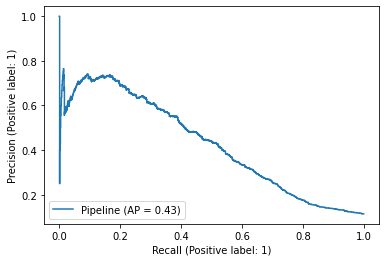

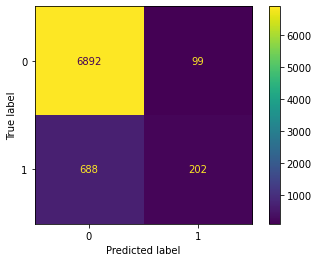

In [12]:
# Logistic Regression
%matplotlib inline

log_pipe = make_pipeline(
    OneHotEncoder(use_cat_names=True),
    LogisticRegression(solver='liblinear')
)

log_pipe.fit(X_train, y_train)
y_pred = log_pipe.predict(X_test)
print(classification_report(y_test, y_pred))
print('ROC_AUC_Score:', roc_auc_score(y_test, y_pred))
PrecisionRecallDisplay.from_estimator(log_pipe, X_test, y_test)
cm = confusion_matrix(y_test,y_pred)
ConfusionMatrixDisplay(cm).plot()

### Random Forest

Cross Validation: [0.36791444 0.37486688 0.3787234 ]
              precision    recall  f1-score   support

           0       0.92      0.97      0.94      6991
           1       0.55      0.30      0.39       890

    accuracy                           0.89      7881
   macro avg       0.73      0.64      0.67      7881
weighted avg       0.87      0.89      0.88      7881

ROC_AUC_Score: 0.6356647953468263


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


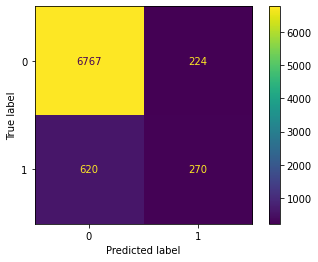

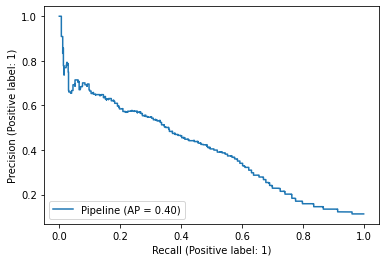

In [13]:
# Random Forest using class_weight = 'balanced' parameter

%matplotlib inline
rf_normal_pipe = make_pipeline(
    OrdinalEncoder(),
    RandomForestClassifier(class_weight=None)
)

print('Cross Validation:',cross_val_score(rf_normal_pipe, X_train, y_train, scoring='f1', cv=3, n_jobs=-1))

rf_normal_pipe.fit(X_train, y_train)
y_pred = rf_normal_pipe.predict(X_test)

print(classification_report(y_test, y_pred))
print('ROC_AUC_Score:', roc_auc_score(y_test, y_pred))

plot_confusion_matrix(rf_normal_pipe, X_test, y_test, values_format='d');

PrecisionRecallDisplay.from_estimator(rf_normal_pipe, X_test, y_test)
plt.show()

              precision    recall  f1-score   support

           0       0.92      0.95      0.93      6991
           1       0.48      0.39      0.43       890

    accuracy                           0.88      7881
   macro avg       0.70      0.67      0.68      7881
weighted avg       0.87      0.88      0.88      7881

ROC_AUC_Score: 0.6683993384753111


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


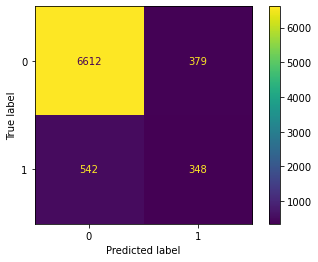

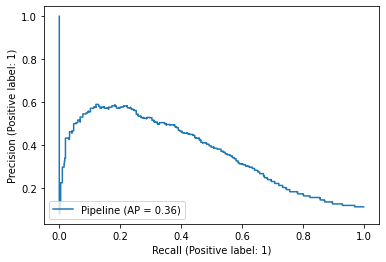

In [14]:
# Random Forest with Oversample Dataset
%matplotlib inline
rf_over_pipe = make_pipeline(
    OrdinalEncoder(),
    RandomForestClassifier()
)

rf_over_pipe.fit(X_oversample, y_oversample)
y_pred = rf_over_pipe.predict(X_test)

print(classification_report(y_test, y_pred))
print('ROC_AUC_Score:', roc_auc_score(y_test, y_pred))

plot_confusion_matrix(rf_over_pipe, X_test, y_test, values_format='d');

PrecisionRecallDisplay.from_estimator(rf_over_pipe, X_test, y_test)
plt.show()

              precision    recall  f1-score   support

           0       0.95      0.79      0.86      6991
           1       0.29      0.68      0.41       890

    accuracy                           0.78      7881
   macro avg       0.62      0.74      0.64      7881
weighted avg       0.88      0.78      0.81      7881

ROC_AUC_Score: 0.736315551776843


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


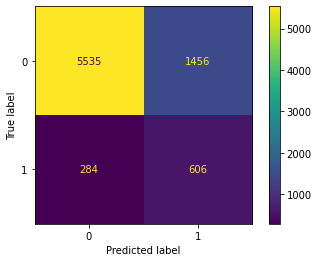

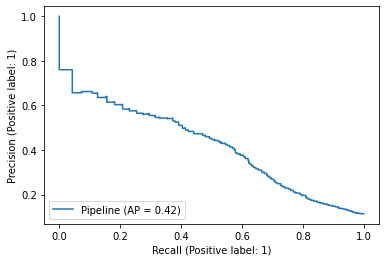

In [15]:
# Random Forest with Undersampled Dataset
%matplotlib inline

rf_under_pipe = make_pipeline(
    OrdinalEncoder(),
    RandomForestClassifier()
)

rf_under_pipe.fit(X_undersample, y_undersample)
y_pred = rf_under_pipe.predict(X_test)

print(classification_report(y_test, y_pred))
print('ROC_AUC_Score:', roc_auc_score(y_test, y_pred))

plot_confusion_matrix(rf_under_pipe, X_test, y_test, values_format='d');

PrecisionRecallDisplay.from_estimator(rf_under_pipe, X_test, y_test)
plt.show()

### XGBoost 


In [16]:
class_weights = compute_class_weight('balanced', classes = np.unique(y_train), y = y_train)
print(class_weights)

[0.56665468 4.25067422]


              precision    recall  f1-score   support

           0       0.91      0.98      0.95      6991
           1       0.65      0.26      0.37       890

    accuracy                           0.90      7881
   macro avg       0.78      0.62      0.66      7881
weighted avg       0.88      0.90      0.88      7881

Cross Validation: [0.33966891 0.36288416 0.32648126]
ROC,AUC Score: 0.8105870469094293


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


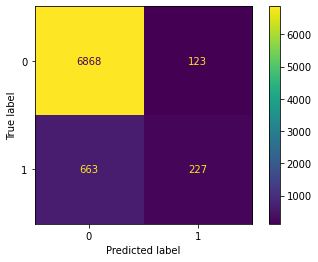

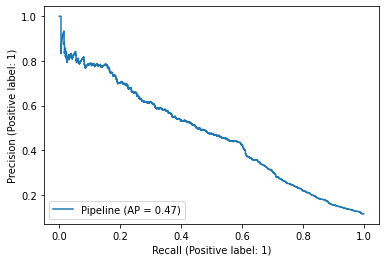

In [17]:
import xgboost as xgb
%matplotlib inline

xgb_normal_pipe = make_pipeline(
    #TargetEncoder(),
    OrdinalEncoder(),
    #OneHotEncoder(use_cat_names=True),
    xgb.XGBClassifier()
)

xgb_normal_pipe.fit(X_train, y_train)
y_pred = xgb_normal_pipe.predict(X_test)
y_prob = xgb_normal_pipe.predict_proba(X_test)[:,1]

print(classification_report(y_test, y_pred))
print('Cross Validation:',cross_val_score(xgb_normal_pipe, X_train, y_train, scoring='f1', cv=3, n_jobs=-1))

print('ROC,AUC Score:',roc_auc_score(y_test, y_prob))
plot_confusion_matrix(xgb_normal_pipe, X_test, y_test, values_format='d');


PrecisionRecallDisplay.from_estimator(xgb_normal_pipe, X_test, y_test)
plt.show()

Cross Validation: [0.62944984 0.62540453 0.63915858]
              precision    recall  f1-score   support

           0       0.95      0.85      0.90      6991
           1       0.35      0.64      0.45       890

    accuracy                           0.82      7881
   macro avg       0.65      0.74      0.67      7881
weighted avg       0.88      0.82      0.84      7881

ROC,AUC Score: 0.8058299675827187


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


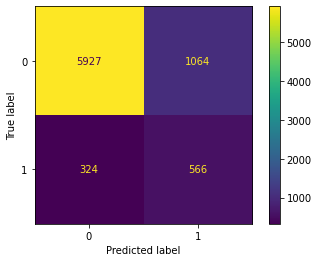

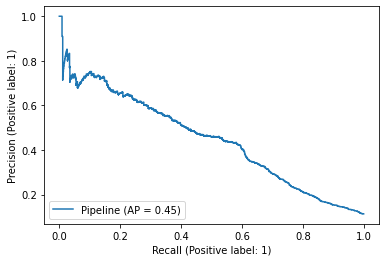

In [18]:
import xgboost as xgb
%matplotlib inline

xgb_under_pipe = make_pipeline(
    OneHotEncoder(use_cat_names=True),
    xgb.XGBClassifier()
)


xgb_under_pipe.fit(X_undersample, y_undersample)
y_pred = xgb_under_pipe.predict(X_test)
y_prob = xgb_under_pipe.predict_proba(X_test)[:,1]

print('Cross Validation:', cross_val_score(xgb_under_pipe, X_undersample, y_undersample, scoring='recall', cv=3, n_jobs=-1))
print(classification_report(y_test, y_pred))

print('ROC,AUC Score:',roc_auc_score(y_test, y_prob))
plot_confusion_matrix(xgb_under_pipe, X_test, y_test, values_format='d');


PrecisionRecallDisplay.from_estimator(xgb_under_pipe, X_test, y_test)
plt.show()

Cross Validation: [0.72337349 0.71665256 0.72476345]
              precision    recall  f1-score   support

           0       0.95      0.85      0.90      6991
           1       0.36      0.64      0.46       890

    accuracy                           0.83      7881
   macro avg       0.65      0.75      0.68      7881
weighted avg       0.88      0.83      0.85      7881

ROC,AUC Score: 0.8108254754507802


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


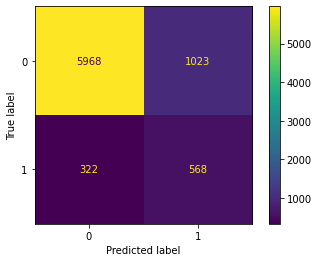

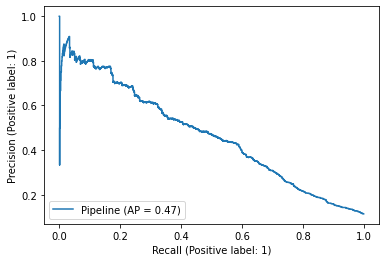

In [19]:
import xgboost as xgb
%matplotlib inline

xgb_over_pipe = make_pipeline(
    OrdinalEncoder(),
    #OneHotEncoder(use_cat_names=True),
    xgb.XGBClassifier()
)

print('Cross Validation:', cross_val_score(xgb_over_pipe, X_oversample, y_oversample, scoring='f1', cv=3, n_jobs=-1))

xgb_over_pipe.fit(X_oversample, y_oversample)
y_pred = xgb_over_pipe.predict(X_test)
y_prob = xgb_over_pipe.predict_proba(X_test)[:,1]

print(classification_report(y_test, y_pred))

print('ROC,AUC Score:',roc_auc_score(y_test, y_prob))
plot_confusion_matrix(xgb_over_pipe, X_test, y_test, values_format='d');


PrecisionRecallDisplay.from_estimator(xgb_over_pipe, X_test, y_test)
plt.show()

## Feature Importance

### XGBoost 

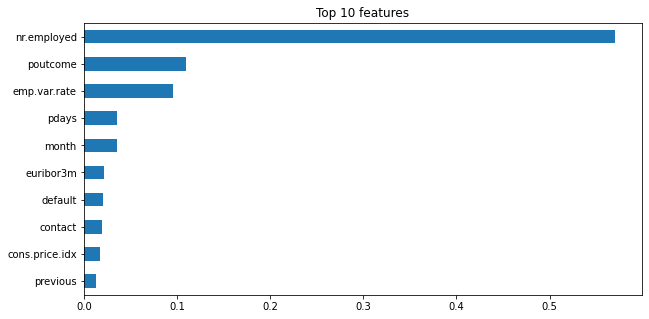

In [20]:
# 특성 중요도
%matplotlib inline
import eli5
from eli5.sklearn import PermutationImportance

rf = xgb_normal_pipe.named_steps['xgbclassifier']

#X_train_transformed = xgb_over_pipe.named_steps['onehotencoder'].transform(X_train)
X_train_transformed = xgb_normal_pipe.named_steps['ordinalencoder'].transform(X_train)

importances = pd.Series(rf.feature_importances_, X_train_transformed.columns)


n = 10
plt.figure(figsize=(10,n/2))
plt.title(f'Top {n} features')
importances.sort_values()[-n:].plot.barh();

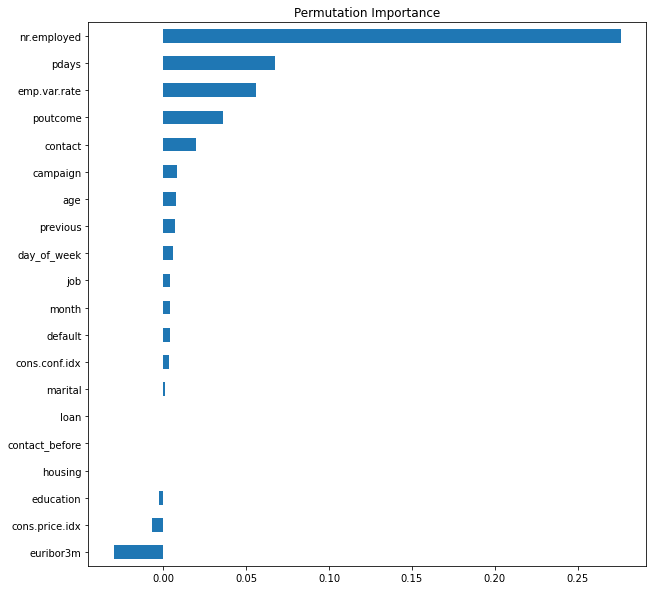

In [21]:
%matplotlib inline

# permuter 정의
permuter = PermutationImportance(
    xgb_normal_pipe.named_steps['xgbclassifier'], # model
    scoring='f1', # metric
    n_iter=5, # 다른 random seed를 사용하여 5번 반복
    random_state=2
)

# permuter 계산은 preprocessing 된 X_val을 사용합니다.
#X_test_transformed = xgb_over_pipe.named_steps['onehotencoder'].transform(X_test)
X_test_transformed = xgb_normal_pipe.named_steps['ordinalencoder'].transform(X_test)

# 실제로 fit 의미보다는 스코어를 다시 계산하는 작업입니다
permuter.fit(X_test_transformed, y_test);

feature_names = X_test_transformed.columns.tolist()

plt.figure(figsize=(10,10))
plt.title(f'Permutation Importance')
pd.Series(permuter.feature_importances_, feature_names).sort_values().plot.barh()

### Random Forest


In [22]:
# 특성 중요도
%matplotlib inline

rf = ranfor_pipe.named_steps['randomforestclassifier']

X_train_transformed = ranfor_pipe.named_steps['ordinalencoder'].transform(X_train)

importances = pd.Series(rf.feature_importances_, X_train_transformed.columns)


n = 10
plt.figure(figsize=(10,n/2))
plt.title(f'Top {n} features')
importances.sort_values()[-n:].plot.barh();

NameError: ignored

In [ ]:
# permuter 정의
permuter = PermutationImportance(
    ranfor_pipe.named_steps['randomforestclassifier'], # model
    scoring='f1', # metric
    n_iter=5, # 다른 random seed를 사용하여 5번 반복
    random_state=2
)

# permuter 계산은 preprocessing 된 X_val을 사용합니다.
X_test_transformed = ranfor_pipe.named_steps['ordinalencoder'].transform(X_test)

# 실제로 fit 의미보다는 스코어를 다시 계산하는 작업입니다
permuter.fit(X_test_transformed, y_test);

feature_names = X_test_transformed.columns.tolist()

plt.figure(figsize=(10,10))
plt.title(f'Permutation Importance')
pd.Series(permuter.feature_importances_, feature_names).sort_values().plot.barh()

## Model Tunning

In [522]:
from sklearn.model_selection import RandomizedSearchCV

random_grid = {'xgbclassifier__max_depth': [3,6,9,12],
               'xgbclassifier__subsample':[0.5,0.75,1],
               'xgbclassifier__min_child_weight': [1,3,5,10],
               'xgbclassifier__scale_pos_weight': [1,4,7,10]
               }

xgb_random = RandomizedSearchCV(xgb_over_pipe, param_distributions = random_grid, n_iter = 50, cv = 2, verbose=2, n_jobs = -1, scoring='f1')
# Fit the random search model
xgb_random.fit(X_train, y_train)

Fitting 2 folds for each of 50 candidates, totalling 100 fits


KeyboardInterrupt: ignored

In [519]:
print(xgb_random.best_params_)
print(xgb_random.best_score_)

{'xgbclassifier__subsample': 0.5, 'xgbclassifier__scale_pos_weight': 4, 'xgbclassifier__min_child_weight': 3, 'xgbclassifier__max_depth': 3}
0.4968680785024008


In [ ]:
dists = {
    'randomforestclassifier__max_depth': [5, 10, 15, 20], 
    'randomforestclassifier__class_weight': ['balanced'], 
    'randomforestclassifier__min_samples_leaf': [1, 3, 5, 10],
    'randomforestclassifier__oob_score': [True],
    'randomforestclassifier__min_samples_split': [2,4,6,8],
}

rf_random = RandomizedSearchCV(ranfor_pipe, param_distributions=dists, n_iter=50, cv=3, scoring='f1', verbose=1, n_jobs=-1)
rf_random.fit(X_train, y_train)

In [ ]:
print(rf_random.best_params_)
print(rf_random.best_score_)

{'randomforestclassifier__oob_score': True, 'randomforestclassifier__min_samples_split': 4, 'randomforestclassifier__min_samples_leaf': 5, 'randomforestclassifier__max_depth': 15, 'randomforestclassifier__class_weight': 'balanced'}
0.5015892662671815


## Final Models

### Random Forest

In [ ]:
%matplotlib inline

ranfor_pipe = make_pipeline(
    OrdinalEncoder(),
    #OneHotEncoder(use_cat_names=True),
    RandomForestClassifier(class_weight='balanced', oob_score=True, min_samples_split=4, min_samples_leaf=5, max_depth=10)
)

ranfor_pipe.fit(X_oversample, y_oversample)
y_pred = ranfor_pipe.predict(X_test)

print(cross_val_score(ranfor_pipe, X_train, y_train, scoring='f1', cv=3, n_jobs=-1))
print(classification_report(y_test, y_pred))

plot_confusion_matrix(ranfor_pipe, X_test, y_test, values_format='d');

PrecisionRecallDisplay.from_estimator(ranfor_pipe, X_test, y_test)
plt.show()

In [ ]:
y_prob = ranfor_pipe.predict_proba(X_test)
y_pred = (y_prob[:,1] >= 0.42).astype(bool) # set threshold as 0.3
print(classification_report(y_test, y_pred))
print('ROC,AUC Score:',roc_auc_score(y_test, y_prob[:,1]))

cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(cm).plot()

### XGBoost

In [ ]:
%matplotlib inline

xgb_normal_pipe = make_pipeline(
    OrdinalEncoder(),
    xgb.XGBClassifier(scale_pos_weight=7, subsample=0.5, min_child_weight=3, max_depth=3)
)

xgb_normal_pipe.fit(X_train, y_train)
y_pred = xgb_normal_pipe.predict(X_test)
y_prob = xgb_normal_pipe.predict_proba(X_test)[:,1]

print(classification_report(y_test, y_pred))

print('ROC,AUC Score:',roc_auc_score(y_test, y_prob))
plot_confusion_matrix(xgb_normal_pipe, X_test, y_test, values_format='d');


PrecisionRecallDisplay.from_estimator(xgb_normal_pipe, X_test, y_test)
plt.show()

In [ ]:
y_prob = xgb_normal_pipe.predict_proba(X_test)
y_pred = (y_prob[:,1] >= 0.42).astype(bool) # set threshold as 0.3
print(classification_report(y_test, y_pred))
print('ROC,AUC Score:',roc_auc_score(y_test, y_prob[:,1]))

cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(cm).plot()

## Result Analysis

In [525]:
X_test.reset_index(inplace=True,drop=True)
prev_data_ind = X_test[X_test['pdays']!=-1].index

hist_data_ans = []
for i in prev_data_ind:
  hist_data_ans.append(y_test.iloc[i])
  
pred_ans = []
for i in prev_data_ind:
  pred_ans.append(y_pred[i])


In [565]:
print('이전 마케팅 대상이었던 고객과 이번 마케팅 성공여부')

print(pd.DataFrame(hist_data_ans).value_counts())

print(pd.DataFrame(hist_data_ans).value_counts(normalize=True))

이전 마케팅 대상이었던 고객과 이번 마케팅 성공여부
1    210
0    105
dtype: int64
1    0.666667
0    0.333333
dtype: float64


              precision    recall  f1-score   support

           0       0.54      0.50      0.52       105
           1       0.76      0.79      0.77       210

    accuracy                           0.69       315
   macro avg       0.65      0.64      0.65       315
weighted avg       0.69      0.69      0.69       315



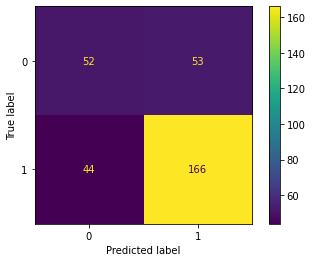

In [526]:
cm = confusion_matrix(hist_data_ans, pred_ans)
print(classification_report(hist_data_ans, pred_ans))
ConfusionMatrixDisplay(cm).plot()

In [ ]:
def explain_rf(row_number):
    positive_class_index = 1
    model = rf_normal_pipe.named_steps['randomforestclassifier']
    # row 값을 변환합니다
    row = X_test.iloc[[row_number]]

    row_processed = rf_normal_pipe.named_steps['ordinalencoder'].transform(row)

    # 예측하고 예측확률을 얻습니다 
    pred = model.predict(row_processed)[0]
    pred_proba = model.predict_proba(row_processed)[0, positive_class_index]
    pred_proba *= 100
    if pred != 1:
        pred_proba = 100 - pred_proba

    # 예측결과와 확률값을 얻습니다
    print(f'이 대출에 대한 예측결과는 {pred} 으로, 확률은 {pred_proba:.0f}% 입니다.')
    
    # SHAP를 추가합니다
    shap_values = explainer.shap_values(row_processed)

    # Fully Paid에 대한 top 3 pros, cons를 얻습니다
    feature_names = row.columns
    feature_values = row.values[0]
    shaps = pd.Series(shap_values[0][0], zip(feature_names, feature_values))
    pros = shaps.sort_values(ascending=False)[:3].index
    cons = shaps.sort_values(ascending=True)[:3].index

    # 예측에 가장 영향을 준 top3
    print('\n')
    print('Positive 영향을 가장 많이 주는 3가지 요인 입니다:')
    
    evidence = pros if pred == positive_class else cons
    for i, info in enumerate(evidence, start=1):
        feature_name, feature_value = info
        print(f'{i}. {feature_name} : {feature_value}')

    # 예측에 가장 반대적인 영향을 준 요인 top1
    print('\n')
    print('Negative 영향을 가장 많이 주는 3가지 요인 입니다:')
    
    evidence = cons if pred == positive_class else pros
    for i, info in enumerate(evidence, start=1):
        feature_name, feature_value = info
        print(f'{i}. {feature_name} : {feature_value}')

    # SHAP
    shap.initjs()
    return shap.force_plot(
        base_value=explainer.expected_value[0], 
        shap_values=shap_values[0], 
        features=row, 
        link='logit'
    )

In [528]:
def explain_xgb(row_number):
    positive_class_index = 1
    model = xgb_normal_pipe.named_steps['xgbclassifier']
    # row 값을 변환합니다
    row = X_test.iloc[[row_number]]

    row_processed = xgb_normal_pipe.named_steps['ordinalencoder'].transform(row)

    # 예측하고 예측확률을 얻습니다 
    pred = model.predict(row_processed)[0]
    pred_proba = model.predict_proba(row_processed)[0, positive_class_index]
    pred_proba *= 100
    if pred != 1:
        pred_proba = 100 - pred_proba

    # 예측결과와 확률값을 얻습니다
    print(f'이 대출에 대한 예측결과는 {pred} 으로, 확률은 {pred_proba:.0f}% 입니다.')
    
    # SHAP를 추가합니다
    shap_values = explainer.shap_values(row_processed)

    # Fully Paid에 대한 top 3 pros, cons를 얻습니다
    feature_names = row.columns
    feature_values = row.values[0]
    shaps = pd.Series(shap_values[0][0], zip(feature_names, feature_values))
    pros = shaps.sort_values(ascending=False)[:3].index
    cons = shaps.sort_values(ascending=True)[:3].index

    # 예측에 가장 영향을 준 top3
    print('\n')
    print('Positive 영향을 가장 많이 주는 3가지 요인 입니다:')
    
    evidence = pros if pred == positive_class else cons
    for i, info in enumerate(evidence, start=1):
        feature_name, feature_value = info
        print(f'{i}. {feature_name} : {feature_value}')

    # 예측에 가장 반대적인 영향을 준 요인 top1
    print('\n')
    print('Negative 영향을 가장 많이 주는 3가지 요인 입니다:')
    
    evidence = cons if pred == positive_class else pros
    for i, info in enumerate(evidence, start=1):
        feature_name, feature_value = info
        print(f'{i}. {feature_name} : {feature_value}')

    # SHAP
    shap.initjs()
    return shap.force_plot(
        base_value=explainer.expected_value[0], 
        shap_values=shap_values[0], 
        features=row, 
        link='logit'
    )

In [533]:
explain_xgb(1)

이 대출에 대한 예측결과는 0 으로, 확률은 70% 입니다.


Positive 영향을 가장 많이 주는 3가지 요인 입니다:
1. default : 0
2. previous : 0
3. month : 8


Negative 영향을 가장 많이 주는 3가지 요인 입니다:
1. age : 41
2. euribor3m : 4.965
3. nr.employed : 5228.1


In [532]:
explain_xgb(300)

이 대출에 대한 예측결과는 0 으로, 확률은 72% 입니다.


Positive 영향을 가장 많이 주는 3가지 요인 입니다:
1. previous : 0
2. poutcome : -1
3. contact_before : 0


Negative 영향을 가장 많이 주는 3가지 요인 입니다:
1. euribor3m : 4.864
2. contact : 0
3. age : 31


In [536]:
explain_xgb(11)

이 대출에 대한 예측결과는 1 으로, 확률은 75% 입니다.


Positive 영향을 가장 많이 주는 3가지 요인 입니다:
1. emp.var.rate : -1.8
2. month : 4
3. cons.price.idx : 93.075


Negative 영향을 가장 많이 주는 3가지 요인 입니다:
1. contact : 0
2. education : basic.4y
3. age : 66


In [529]:
explain_xgb(7879)

이 대출에 대한 예측결과는 1 으로, 확률은 89% 입니다.


Positive 영향을 가장 많이 주는 3가지 요인 입니다:
1. nr.employed : 5017.5
2. contact_before : 1
3. pdays : 8


Negative 영향을 가장 많이 주는 3가지 요인 입니다:
1. age : 50
2. poutcome : 0
3. day_of_week : 4


In [2]:
explain_xgb(1787)

NameError: ignored